Thư viện

In [2]:
# Thư viện
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1, l2, l1_l2
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

Đọc tệp csv

In [3]:
import pandas as pd

# Tải tệp csv
file_path = r"D:\projects\Automatic_Driving_System\Data\driving_log.csv"
data = pd.read_csv(file_path)
data.head(5)


,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\center_2023_12_17_11_51_37_719.jpg,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\left_2023_12_17_11_51_37_719.jpg,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\right_2023_12_17_11_51_37_719.jpg,0,0.1,0.2,4.505362E-06
0,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,0.0,0.0,0.0,0.000004
1,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,0.0,0.0,0.0,0.000001
2,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,0.0,0.0,0.0,0.000009
3,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,0.0,0.0,0.0,0.000027
4,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,D:\projects\Automatic_Driving_System\beta_simu...,0.0,0.0,0.0,0.000008


Gán tên cho các cột

In [4]:
# Gán tên mới cho các cột
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data.columns = columns

# Điều chỉnh độ rộng tối đa cho hiển thị của mỗi cột
# Điều chỉnh độ rộng tối đa là 100
pd.set_option('display.max_colwidth', 100)  # Hoặc một số lớn khác

data.head()

,center,left,right,steering,throttle,reverse,speed
0,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\center_2023_12_17_11_51_37_...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\left_2023_12_17_11_51_37_78...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\right_2023_12_17_11_51_37_7...,0.0,0.0,0.0,0.000004
1,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\center_2023_12_17_11_51_37_...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\left_2023_12_17_11_51_37_85...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\right_2023_12_17_11_51_37_8...,0.0,0.0,0.0,0.000001
2,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\center_2023_12_17_11_51_37_...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\left_2023_12_17_11_51_37_92...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\right_2023_12_17_11_51_37_9...,0.0,0.0,0.0,0.000009
3,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\center_2023_12_17_11_51_37_...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\left_2023_12_17_11_51_37_99...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\right_2023_12_17_11_51_37_9...,0.0,0.0,0.0,0.000027
4,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\center_2023_12_17_11_51_38_...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\left_2023_12_17_11_51_38_06...,D:\projects\Automatic_Driving_System\beta_simulator_windows\Data\IMG\right_2023_12_17_11_51_38_0...,0.0,0.0,0.0,0.000008


Loại bỏ các đường dẫn tệp

In [5]:
# Hàm để lấy tên tệp từ đường dẫn đầy đủ
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

# Áp dụng hàm này cho các cột 'center', 'left', 'right'
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

# Hiển thị 5 dòng đầu tiên để kiểm tra
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_12_17_11_51_37_785.jpg,left_2023_12_17_11_51_37_785.jpg,right_2023_12_17_11_51_37_785.jpg,0.0,0.0,0.0,0.000004
1,center_2023_12_17_11_51_37_856.jpg,left_2023_12_17_11_51_37_856.jpg,right_2023_12_17_11_51_37_856.jpg,0.0,0.0,0.0,0.000001
2,center_2023_12_17_11_51_37_926.jpg,left_2023_12_17_11_51_37_926.jpg,right_2023_12_17_11_51_37_926.jpg,0.0,0.0,0.0,0.000009
3,center_2023_12_17_11_51_37_998.jpg,left_2023_12_17_11_51_37_998.jpg,right_2023_12_17_11_51_37_998.jpg,0.0,0.0,0.0,0.000027
4,center_2023_12_17_11_51_38_069.jpg,left_2023_12_17_11_51_38_069.jpg,right_2023_12_17_11_51_38_069.jpg,0.0,0.0,0.0,0.000008


Biểu đồ hiển thị số lượng bins và mẫu mỗi bin

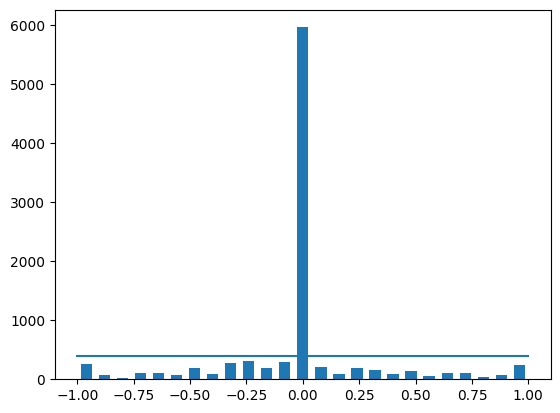

In [6]:
# Thiết lập số lượng steering và giá trị mỗi steering
num_bins = 25
samples_per_bin = 400

# Tính toán histogram
hist, bins = np.histogram(data['steering'], num_bins)

# Tính toán trung tâm của mỗi bin
center = (bins[:-1] + bins[1:]) * 0.5

# Vẽ biểu đồ bar
plt.bar(center, hist, width=0.05)

# Vẽ một đường ngang tại mức samples_per_bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

# Hiển thị biểu đồ
plt.show()


In [7]:
print('total data:', len(data))
data.shape

total data: 9451


(9451, 7)

Loại bỏ ourlier

In [8]:
# Giảm số lượng mẫu trong mỗi "steering" (khoảng giá trị) của histogram xuống một ngưỡng cụ thể
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if bins[j] <= data['steering'].iloc[i] < bins[j+1]:
            list_.append(i)
    shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))


removed: 5559
remaining: 3892


Biểu đồ sau khi loại bỏ ourlier

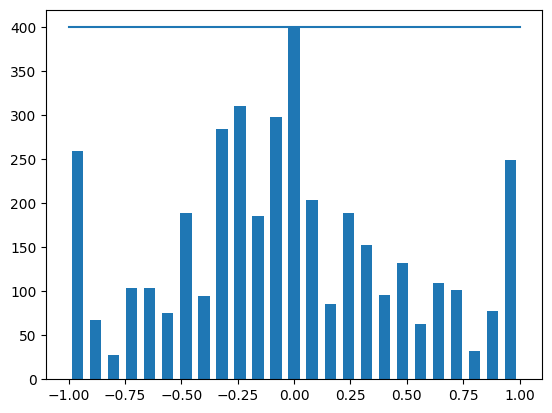

In [9]:
# Tính toán histogram mới
hist, bins = np.histogram(data['steering'], num_bins)

# Tính toán trung tâm của mỗi bin
center = (bins[:-1] + bins[1:]) * 0.5

# Vẽ biểu đồ bar cho histogram
plt.bar(center, hist, width=0.05)

# Vẽ một đường ngang tại mức samples_per_bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

# Hiển thị biểu đồ
plt.show()


Tạo ra hai danh sách: “image_paths” và “steerings”

In [10]:
# Tạo ra hai danh sách: “image_paths” và “steerings”. 
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(df)):
        indexed_data = df.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data[3]) + 0.15)
        # right image append
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data[3]) - 0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

In [11]:
datadir = r"D:\projects\Automatic_Driving_System\Data"
# Tạo dữ liệu hình ảnh và giá trị lái
image_paths, steerings = load_img_steering(datadir + '\IMG', data)

C:\Users\HELLO\AppData\Local\Temp\ipykernel_20552\853797113.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\HELLO\AppData\Local\Temp\ipykernel_20552\853797113.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\HELLO\AppData\Local\Temp\ipykernel_20552\853797113.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

In [12]:
image_paths


array(['D:\\projects\\Automatic_Driving_System\\Data\\IMG\\center_2023_12_17_11_51_37_785.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\left_2023_12_17_11_51_37_785.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\right_2023_12_17_11_51_37_785.jpg',
       ...,
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\center_2023_12_17_12_08_27_984.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\left_2023_12_17_12_08_27_984.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\right_2023_12_17_12_08_27_984.jpg'],
      dtype='<U80')

In [13]:
len(image_paths)

11676

In [228]:
steerings

array([ 0.       ,  0.15     , -0.15     , ...,  0.6500001,  0.8000001,
        0.5000001])

Chia thành tập dữ liệu train và test

In [229]:
# Phân chia dữ liệu thành tập đào tạo và kiểm thử
X_train, X_test, y_train, y_test = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

# In số lượng mẫu đào tạo và kiểm thử
print('Training Samples: {}\nTest Samples: {}'.format(len(X_train), len(X_test)))

Training Samples: 9340
Test Samples: 2336


Hiển thị

Text(0.5, 1.0, 'Testing set')

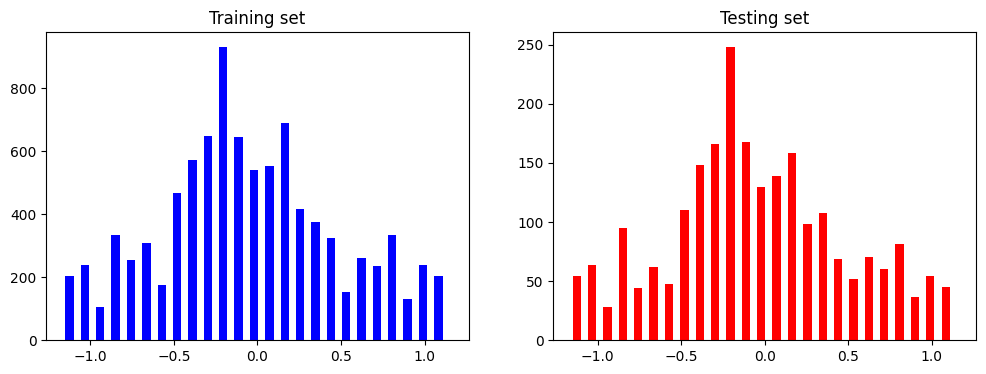

In [230]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_test, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Testing set')

Hàm phóng to ảnh

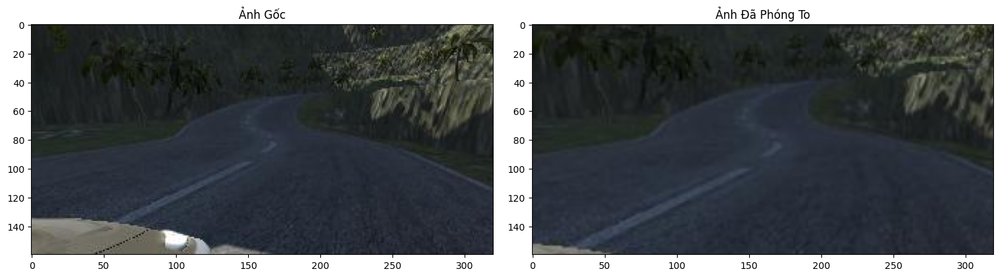

In [231]:
# Phóng to ảnh
def zoom(image):
    zoom_aug = iaa.Affine(scale=(1.3, 1.3))  # Phóng to đồng đều
    return zoom_aug.augment_image(image)

if len(image_paths) > 0:
    image_path = image_paths[random.randint(0, len(image_paths) - 1)]
    try:
        original_image = mpimg.imread(image_path)
        zoomed_image = zoom(original_image)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc')

        axs[1].imshow(zoomed_image)
        axs[1].set_title('Ảnh Đã Phóng To')

        plt.show()
    except IOError:
        print("Không thể đọc ảnh từ đường dẫn:", image_path)
else:
    print("Không có ảnh trong danh sách image_paths.")

Hàm di chuyển ảnh

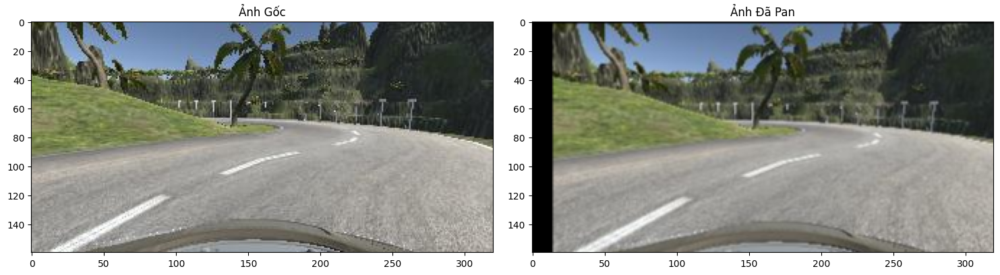

In [232]:
# Thực hiện di chuyển ảnh
def pan(image):
    pan_aug = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    return pan_aug.augment_image(image)

if len(image_paths) > 0:
    random_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[random_index]
    try:
        original_image = mpimg.imread(image_path)
        panned_image = pan(original_image)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc')

        axs[1].imshow(panned_image)
        axs[1].set_title('Ảnh Đã Pan')

        plt.show()
    except FileNotFoundError:
        print(f"Không thể tìm thấy tệp: {image_path}")
else:
    print("Không có ảnh trong danh sách image_paths.")

Hàm chỉnh độ sáng cho ảnh

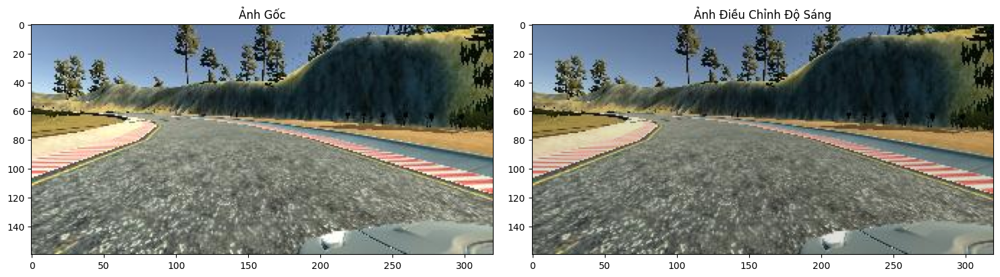

In [233]:
# Điều chỉnh độ sáng cho ảnh
def img_random_brightness(image):
    brightness_aug = iaa.Multiply((0.2, 1.2))
    return brightness_aug.augment_image(image)

if len(image_paths) > 0:
    random_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[random_index]
    try:
        original_image = mpimg.imread(image_path)
        brightness_altered_image = img_random_brightness(original_image)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc')

        axs[1].imshow(brightness_altered_image)
        axs[1].set_title('Ảnh Điều Chỉnh Độ Sáng')

        plt.show()
    except FileNotFoundError:
        print(f"Không thể tìm thấy tệp: {image_path}")
else:
    print("Không có ảnh trong danh sách image_paths.")

Hàm lật ảnh và đảo ngược giá trị góc lái

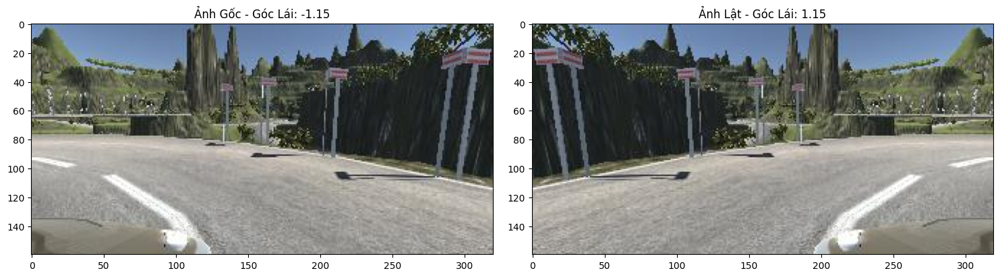

In [234]:
# Lật ảnh (flip) theo chiều ngang và đồng thời đảo ngược giá trị góc lái xe tương ứng
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

if len(image_paths) > 0 and len(steerings) > 0:
    random_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[random_index]
    steering_angle = steerings[random_index]

    try:
        original_image = mpimg.imread(image_path)
        flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc - Góc Lái: ' + str(steering_angle))

        axs[1].imshow(flipped_image)
        axs[1].set_title('Ảnh Lật - Góc Lái: ' + str(flipped_steering_angle))

        plt.show()
    except FileNotFoundError:
        print(f"Không thể tìm thấy tệp: {image_path}")
else:
    print("Danh sách image_paths hoặc steerings trống.")

Hàm tổng hợp để tâng cường dữ liệu

In [235]:
# Thực hiện tăng cường dữ liệu bằng cách thực hiện các phép biến đổi ngẫu nhiên trên ảnh và góc lái (steering angle)
def random_augment(image_path, steering_angle):
    if not os.path.isfile(image_path):
        raise FileNotFoundError(f"Không tìm thấy tệp ảnh: {image_path}")
    
    image = mpimg.imread(image_path)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

Hiển thị các ảnh sau khi tăng cường

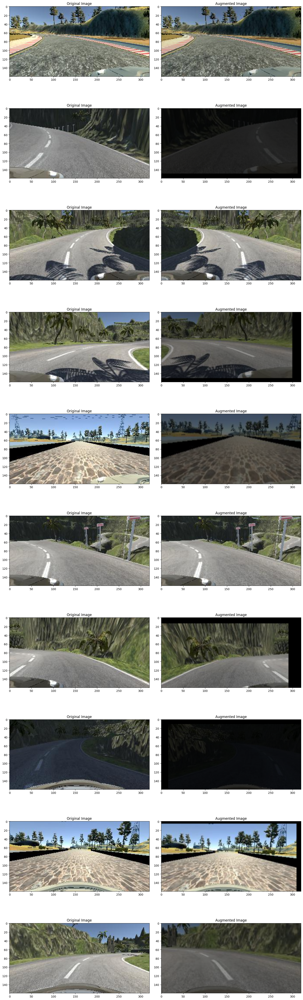

In [236]:
# Hiển thị một loạt các ảnh gốc và ảnh đã qua biến đổi (augmentation) cùng với giá trị góc lái tương ứng.
ncol = 2
nrow = 10

# Kiểm tra độ dài của image_paths và steerings
if len(image_paths) > 0 and len(steerings) > 0 and len(image_paths) == len(steerings):
    fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
    fig.tight_layout()

    for i in range(nrow):
        randnum = random.randint(0, len(image_paths) - 1)
        random_image = image_paths[randnum]
        random_steering = steerings[randnum]

        try:
            original_image = mpimg.imread(random_image)
            augmented_image, steering = random_augment(random_image, random_steering)

            axs[i][0].imshow(original_image)
            axs[i][0].set_title("Original Image")

            axs[i][1].imshow(augmented_image)
            axs[i][1].set_title("Augmented Image")
        except FileNotFoundError:
            print(f"Không thể tìm thấy tệp: {random_image}")

    plt.show()
else:
    print("Danh sách image_paths hoặc steerings trống hoặc không khớp.")

Thực hiện xử lý lọc ảnh

In [237]:
# Chuẩn bị các thiết kế ảnh
def img_preprocess(img):
    # Kiểm tra xem ảnh có tồn tại không
    if img is None:
        raise ValueError("Không có ảnh để xử lý")

    # Cắt ảnh để loại bỏ phần không cần thiết (ví dụ: bầu trời và phần dưới của xe)
    # Đây là cắt từ hàng pixel thứ 60 đến 135
    img = img[60:135,:,:]

    # Chuyển đổi ảnh từ không gian màu RGB sang YUV
    # YUV thường được sử dụng trong xử lý ảnh xe hơi do hiệu quả trong việc
    # phân biệt các đặc trưng quan trọng cho lái xe
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

    # Áp dụng Gaussian Blur để làm mờ ảnh, giúp giảm nhiễu và chi tiết không cần thiết
    img = cv2.GaussianBlur(img,  (3, 3), 0)

    # Thay đổi kích thước ảnh để phù hợp với kích thước đầu vào cần thiết của mô hình học máy
    # Ở đây ảnh được thay đổi thành kích thước 200x66
    img = cv2.resize(img, (200, 66))

    # Chuẩn hóa giá trị pixel của ảnh về khoảng từ 0 đến 1
    img = img / 255

    return img


Text(0.5, 1.0, 'Preprocessed Image')

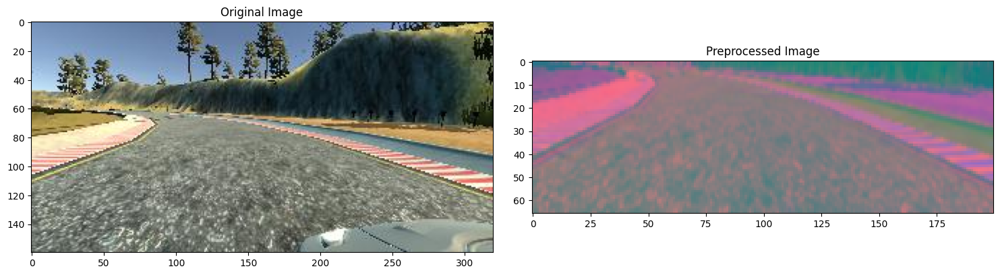

In [238]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [239]:
!nvidia-smi

Mon Dec 18 01:48:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.40       Driver Version: 516.40       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   57C    P5    19W /  N/A |     80MiB /  4096MiB |     99%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Hàm huấn luyện cho mô hình

In [240]:
# Huấn luyện mô hình
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_test_gen, y_valid_gen = next(batch_generator(X_test, y_test, 1, 0))

Text(0.5, 1.0, 'Testing Image')

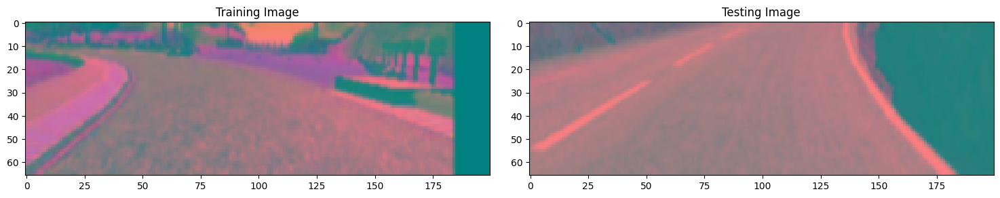

In [241]:

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_test_gen[0])
axs[1].set_title('Testing Image')
     

TẠO MÔ HÌNH TÍNH TOÁN GÓC LÁI TỪ HÌNH ẢNH

In [242]:
#  Mô hình dự đoán vô-lăng hoặc hướng lái từ hình ảnh camera trên xe
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu')) # Adjusted filter size
    model.add(Conv2D(64, (3, 3), activation='elu')) # Uncommented this line

    model.add(Flatten())

    model.add(Dense(100, activation='elu', kernel_regularizer=l2(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(50, activation='elu', kernel_regularizer=l2(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(10, activation='elu', kernel_regularizer=l2(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(1))

    optimizer = Adam(learning_rate=1e-4) # Adjusted learning rate
    model.compile(loss='mse', optimizer=optimizer)
    return model

nvidia_model = nvidia_model()
print(nvidia_model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_59 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_60 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_61 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_62 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_9 (Flatten)         (None, 1152)              0         
                                                                 
 dense_34 (Dense)            (None, 100)              

Tìm learning rate phù hợp cho Tính Toán Góc Lái

In [243]:
from tensorflow.keras.callbacks import Callback
import tensorflow.keras.backend as K
import math

class LearningRateFinder(Callback):
    def __init__(self, start_lr=1e-7, end_lr=1, steps=1000, beta=0.98):
        super().__init__()
        self.start_lr = start_lr
        self.end_lr = end_lr
        self.steps = steps
        self.beta = beta
        self.lr_mult = (end_lr / start_lr) ** (1 / steps)
        self.avg_loss = 0
        self.best_loss = 1e9
        self.batch_num = 0
        self.losses = []
        self.lrs = []

    def on_train_begin(self, logs={}):
        K.set_value(self.model.optimizer.lr, self.start_lr)

    def on_batch_end(self, batch, logs={}):
        lr = K.get_value(self.model.optimizer.lr)
        self.batch_num += 1

        # Smooth the loss
        self.avg_loss = self.beta * self.avg_loss + (1 - self.beta) * logs['loss']
        smoothed_loss = self.avg_loss / (1 - self.beta ** self.batch_num)

        # Stop if the loss is exploding
        if self.batch_num > 1 and smoothed_loss > 4 * self.best_loss:
            self.model.stop_training = True
            return

        # Record the best loss
        if smoothed_loss < self.best_loss or self.batch_num == 1:
            self.best_loss = smoothed_loss

        # Store the values
        self.losses.append(smoothed_loss)
        self.lrs.append(lr)

        # Update the lr for the next step
        lr *= self.lr_mult
        K.set_value(self.model.optimizer.lr, lr)

# Sử dụng LearningRateFinder
lr_finder = LearningRateFinder(start_lr=1e-7, end_lr=1, steps=1000)

nvidia_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                   steps_per_epoch=300,
                                   epochs=1,  # Chú ý: Chỉ chạy 1 epoch
                                   callbacks=[lr_finder],
                                   verbose=1)


C:\Users\HELLO\AppData\Local\Temp\ipykernel_15896\2756638997.py:50: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  nvidia_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


300/300 [==============================] - 120s 395ms/step - loss: 0.8973


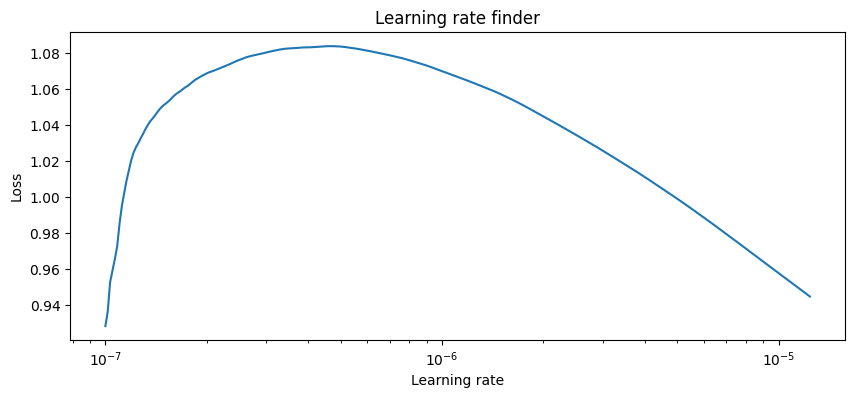

In [244]:
lrs = lr_finder.lrs
losses = lr_finder.losses

plt.figure(figsize=(10, 4))
plt.plot(lrs, losses)
plt.xscale('log')
plt.xlabel('Learning rate')
plt.ylabel('Loss')
plt.title('Learning rate finder')
plt.show()

Thực hiện train mode

In [245]:
history1 = nvidia_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_test, y_test, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

C:\Users\HELLO\AppData\Local\Temp\ipykernel_15896\1335929224.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1 = nvidia_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 148s 494ms/step - loss: 0.5698 - val_loss: 0.5223
Epoch 2/10
300/300 [==============================] - 145s 486ms/step - loss: 0.5408 - val_loss: 0.4926
Epoch 3/10
300/300 [==============================] - 145s 485ms/step - loss: 0.5203 - val_loss: 0.4650
Epoch 4/10
300/300 [==============================] - 147s 492ms/step - loss: 0.5093 - val_loss: 0.4527
Epoch 5/10
300/300 [==============================] - 149s 499ms/step - loss: 0.4999 - val_loss: 0.4505
Epoch 6/10
300/300 [==============================] - 151s 505ms/step - loss: 0.4994 - val_loss: 0.4514
Epoch 7/10
300/300 [==============================] - 154s 514ms/step - loss: 0.4948 - val_loss: 0.4424
Epoch 8/10
300/300 [==============================] - 136s 454ms/step - loss: 0.4841 - val_loss: 0.4380
Epoch 9/10
300/300 [==============================] - 136s 454ms/step - loss: 0.4856 - val_loss: 0.4369
Epoch 10/10
300/300 [==============================] - 136s 454m

Text(0.5, 0, 'Epoch')

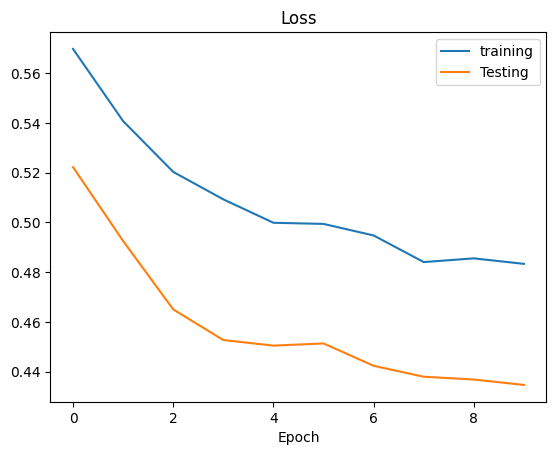

In [246]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.legend(['training', 'Testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [247]:
nvidia_model.save('model2.h5')

C:\Users\HELLO\AppData\Roaming\Python\Python310\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


MÔ HÌNH PHÁT HIỆN LÀN ĐƯỜNG

In [248]:
# Mô hình phát hiện làn đươngf(dự đoán vị trí của vạch kẻ đường)
def build_lane_detection_model():
    model = Sequential()

    # Lớp Convolutional 1
    model.add(Conv2D(16, (3, 3), activation='relu', input_shape=(66, 200, 3)))
    model.add(MaxPooling2D())

    # Lớp Convolutional 2
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D())

    # Lớp Convolutional 3
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D())

    # Flatten để chuyển đổi dữ liệu từ 2D sang 1D
    model.add(Flatten())

    # Lớp Dense với Dropout để tránh overfitting
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))

    # Lớp đầu ra, giả sử chúng ta đang cố gắng dự đoán 2 giá trị: vị trí của hai vạch kẻ đường
    model.add(Dense(2))  # Đầu ra là 2 giá trị

    # Compile model với optimizer và hàm mất mát
    model.compile(optimizer='adam', loss='mean_squared_error')

    return model

# Tạo mô hình và in ra bảng tóm tắt
lane_detection_model = build_lane_detection_model()
print(lane_detection_model.summary())


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_63 (Conv2D)          (None, 64, 198, 16)       448       
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 32, 99, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_64 (Conv2D)          (None, 30, 97, 32)        4640      
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 15, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_65 (Conv2D)          (None, 13, 46, 64)        18496     
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 6, 23, 64)       

Tìm learning rate phù hợp

In [249]:
from tensorflow.keras.callbacks import Callback
import tensorflow.keras.backend as K
import math

class LearningRateFinder(Callback):
    def __init__(self, start_lr=1e-7, end_lr=1, steps=1000, beta=0.98):
        super().__init__()
        self.start_lr = start_lr
        self.end_lr = end_lr
        self.steps = steps
        self.beta = beta
        self.lr_mult = (end_lr / start_lr) ** (1 / steps)
        self.avg_loss = 0
        self.best_loss = 1e9
        self.batch_num = 0
        self.losses = []
        self.lrs = []

    def on_train_begin(self, logs={}):
        K.set_value(self.model.optimizer.lr, self.start_lr)

    def on_batch_end(self, batch, logs={}):
        lr = K.get_value(self.model.optimizer.lr)
        self.batch_num += 1

        # Smooth the loss
        self.avg_loss = self.beta * self.avg_loss + (1 - self.beta) * logs['loss']
        smoothed_loss = self.avg_loss / (1 - self.beta ** self.batch_num)

        # Stop if the loss is exploding
        if self.batch_num > 1 and smoothed_loss > 4 * self.best_loss:
            self.model.stop_training = True
            return

        # Record the best loss
        if smoothed_loss < self.best_loss or self.batch_num == 1:
            self.best_loss = smoothed_loss

        # Store the values
        self.losses.append(smoothed_loss)
        self.lrs.append(lr)

        # Update the lr for the next step
        lr *= self.lr_mult
        K.set_value(self.model.optimizer.lr, lr)

# Sử dụng LearningRateFinder
lr_finder = LearningRateFinder(start_lr=1e-7, end_lr=1, steps=1000)

lane_detection_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                   steps_per_epoch=300,
                                   epochs=1,  # Chú ý: Chỉ chạy 1 epoch
                                   callbacks=[lr_finder],
                                   verbose=1)

C:\Users\HELLO\AppData\Local\Temp\ipykernel_15896\3274274853.py:50: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  lane_detection_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


300/300 [==============================] - 131s 434ms/step - loss: 0.2942


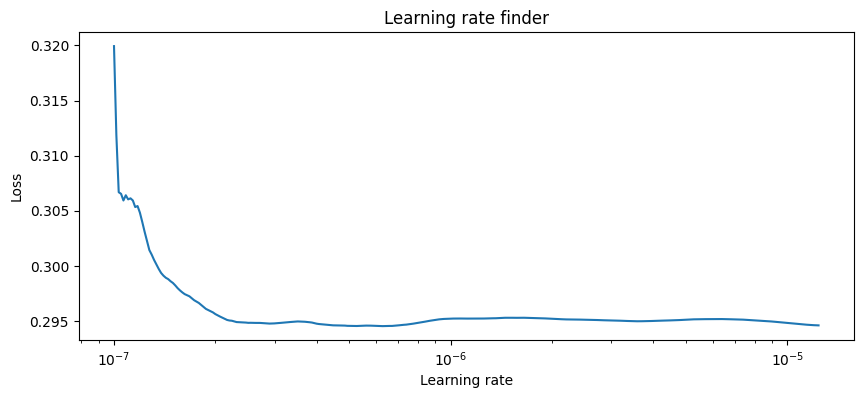

In [250]:
lrs = lr_finder.lrs
losses = lr_finder.losses

plt.figure(figsize=(10, 4))
plt.plot(lrs, losses)
plt.xscale('log')
plt.xlabel('Learning rate')
plt.ylabel('Loss')
plt.title('Learning rate finder')
plt.show()

Train Model

In [251]:
# Huấn luyện mô hình
history2 = lane_detection_model.fit(
    x=batch_generator(X_train, y_train, 100, 1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_test, y_test, 100, 0),
    validation_steps=200,
    verbose=1,
    shuffle=True  # shuffle được đặt là True mặc định trong fit
)

Epoch 1/10
300/300 [==============================] - 163s 544ms/step - loss: 0.2472 - val_loss: 0.2091
Epoch 2/10
300/300 [==============================] - 164s 550ms/step - loss: 0.2214 - val_loss: 0.1950
Epoch 3/10
300/300 [==============================] - 165s 550ms/step - loss: 0.2063 - val_loss: 0.1842
Epoch 4/10
300/300 [==============================] - 166s 553ms/step - loss: 0.1948 - val_loss: 0.1778
Epoch 5/10
300/300 [==============================] - 167s 558ms/step - loss: 0.1931 - val_loss: 0.1658
Epoch 6/10
300/300 [==============================] - 172s 576ms/step - loss: 0.1828 - val_loss: 0.1626
Epoch 7/10
300/300 [==============================] - 175s 585ms/step - loss: 0.1790 - val_loss: 0.1536
Epoch 8/10
300/300 [==============================] - 153s 513ms/step - loss: 0.1742 - val_loss: 0.1422
Epoch 9/10
300/300 [==============================] - 155s 519ms/step - loss: 0.1726 - val_loss: 0.1377
Epoch 10/10
300/300 [==============================] - 154s 516m

Text(0.5, 0, 'Epoch')

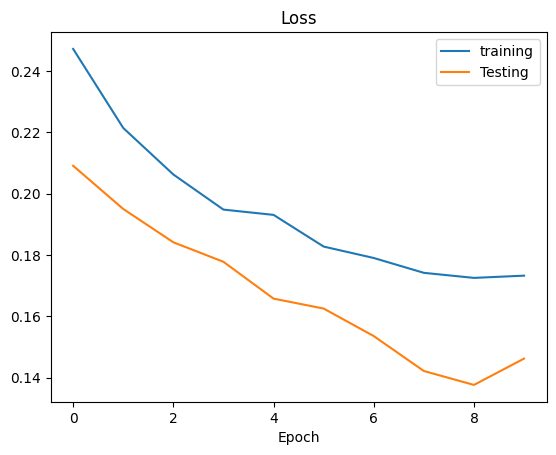

In [252]:
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.legend(['training', 'Testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [253]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate, Dense
from tensorflow.keras.optimizers import Adam

# Tích hợp các mô hình
def build_combined_model(nvidia_model, lane_detection_model):
    # Định nghĩa đầu vào
    input_shape = (66, 200, 3)
    input_layer = Input(shape=input_shape)

    # Sử dụng output từ mỗi mô hình
    nvidia_output = nvidia_model(input_layer)
    lane_output = lane_detection_model(input_layer)

    # Kết hợp đầu ra của cả hai mô hình
    combined_output = Concatenate()([nvidia_output, lane_output])

    # Thêm lớp Dense cuối cùng để đưa ra quyết định
    final_output = Dense(1)(combined_output)

    # Tạo mô hình tổng hợp
    combined_model = Model(inputs=input_layer, outputs=final_output)

    # Compile model
    combined_model.compile(loss='mse', optimizer=Adam(learning_rate=1e-4))

    return combined_model

# Tạo mô hình tổng hợp
combined_model = build_combined_model(nvidia_model, lane_detection_model)
print(combined_model.summary())


Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 66, 200, 3)]         0         []                            
                                                                                                  
 sequential_9 (Sequential)   (None, 1)                    252219    ['input_5[0][0]']             
                                                                                                  
 sequential_10 (Sequential)  (None, 2)                    1154466   ['input_5[0][0]']             
                                                                                                  
 concatenate_8 (Concatenate  (None, 3)                    0         ['sequential_9[0][0]',        
 )                                                                   'sequential_10[0][0]'] 

Tìm learning rate phù hợp cho mô hình tổng hợp

In [254]:
from tensorflow.keras.callbacks import Callback
import tensorflow.keras.backend as K
import math

class LearningRateFinder(Callback):
    def __init__(self, start_lr=1e-7, end_lr=1, steps=1000, beta=0.98):
        super().__init__()
        self.start_lr = start_lr
        self.end_lr = end_lr
        self.steps = steps
        self.beta = beta
        self.lr_mult = (end_lr / start_lr) ** (1 / steps)
        self.avg_loss = 0
        self.best_loss = 1e9
        self.batch_num = 0
        self.losses = []
        self.lrs = []

    def on_train_begin(self, logs={}):
        K.set_value(self.model.optimizer.lr, self.start_lr)

    def on_batch_end(self, batch, logs={}):
        lr = K.get_value(self.model.optimizer.lr)
        self.batch_num += 1

        # Smooth the loss
        self.avg_loss = self.beta * self.avg_loss + (1 - self.beta) * logs['loss']
        smoothed_loss = self.avg_loss / (1 - self.beta ** self.batch_num)

        # Stop if the loss is exploding
        if self.batch_num > 1 and smoothed_loss > 4 * self.best_loss:
            self.model.stop_training = True
            return

        # Record the best loss
        if smoothed_loss < self.best_loss or self.batch_num == 1:
            self.best_loss = smoothed_loss

        # Store the values
        self.losses.append(smoothed_loss)
        self.lrs.append(lr)

        # Update the lr for the next step
        lr *= self.lr_mult
        K.set_value(self.model.optimizer.lr, lr)

# Sử dụng LearningRateFinder
lr_finder = LearningRateFinder(start_lr=1e-7, end_lr=1, steps=1000)

combined_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                   steps_per_epoch=300,
                                   epochs=1,  # Chú ý: Chỉ chạy 1 epoch
                                   callbacks=[lr_finder],
                                   verbose=1)


C:\Users\HELLO\AppData\Local\Temp\ipykernel_15896\2093430607.py:50: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  combined_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


300/300 [==============================] - 148s 483ms/step - loss: 1.3582


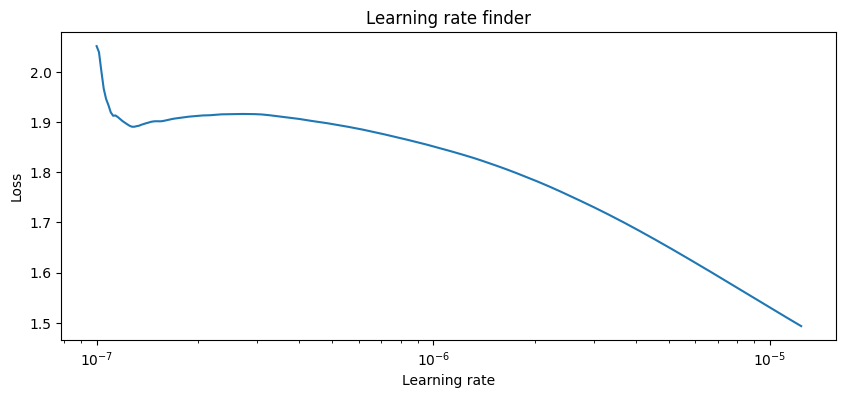

In [255]:
lrs = lr_finder.lrs
losses = lr_finder.losses

plt.figure(figsize=(10, 4))
plt.plot(lrs, losses)
plt.xscale('log')
plt.xlabel('Learning rate')
plt.ylabel('Loss')
plt.title('Learning rate finder')
plt.show()

In [256]:
history = combined_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_test, y_test, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)
     

C:\Users\HELLO\AppData\Local\Temp\ipykernel_15896\2640487783.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = combined_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 178s 595ms/step - loss: 0.5382 - val_loss: 0.4933
Epoch 2/10
300/300 [==============================] - 181s 606ms/step - loss: 0.4977 - val_loss: 0.4626
Epoch 3/10
300/300 [==============================] - 179s 599ms/step - loss: 0.4811 - val_loss: 0.4370
Epoch 4/10
300/300 [==============================] - 182s 607ms/step - loss: 0.4662 - val_loss: 0.4235
Epoch 5/10
300/300 [==============================] - 182s 607ms/step - loss: 0.4543 - val_loss: 0.4127
Epoch 6/10
300/300 [==============================] - 186s 623ms/step - loss: 0.4521 - val_loss: 0.4075
Epoch 7/10
300/300 [==============================] - 190s 634ms/step - loss: 0.4430 - val_loss: 0.4028
Epoch 8/10
300/300 [==============================] - 170s 568ms/step - loss: 0.4375 - val_loss: 0.4011
Epoch 9/10
300/300 [==============================] - 170s 568ms/step - loss: 0.4325 - val_loss: 0.3943
Epoch 10/10
300/300 [==============================] - 169s 566m

Text(0.5, 0, 'Epoch')

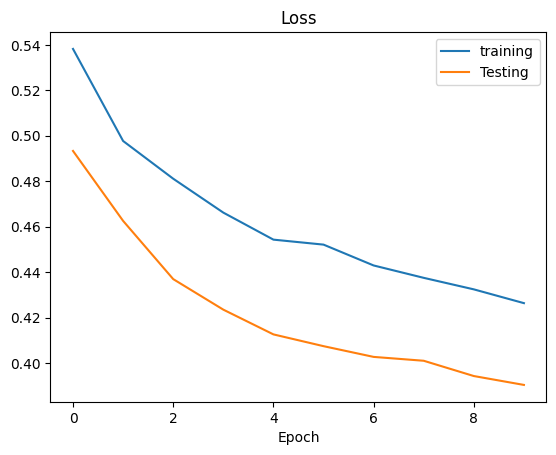

In [257]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'Testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [258]:
# combined_model.save('model.h5')